In [ ]:
!pip install praw

In [ ]:
import praw
import requests
import pandas as pd
import json
from datetime import datetime
import networkx as nx
import matplotlib.pyplot as plt
from google.colab import drive
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import matplotlib.colors as mcolors

# Download NLTK resources
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#To access the Json file, please change the path of the file containing the credetials for to use the reddit API
with open("/content/drive/MyDrive/projectWSNA/redditCredentials.json", "r") as f:
    credentials = json.load(f)

In [ ]:
reddit = praw.Reddit(client_id=credentials['CLIENT_ID'],
                     client_secret=credentials['SECRET_TOKEN'],
                     password=credentials['PASSWORD'],
                     user_agent='Tutorial by /user/SMA202324',
                     username=credentials['USERNAME'],
                     check_for_async=False)

In [ ]:
subreddit_name = 'ArtificialInteligence'

In [ ]:
keywords = 'ChatGPT'

In [ ]:
#Collection of the reddit submission
submissions_data = []

for submission in reddit.subreddit(subreddit_name).search(keywords, limit=100):
    submission_data = {
        'author': '',
        'comments': submission.comments,
        'created_utc': submission.created_utc,
        'id': submission.id,
        'name': submission.name,
        'num_comments': submission.num_comments,
        'selftext': '',
        'subreddit': submission.subreddit,
        'title': submission.title,
    }


    try:
        submission_data['author'] = submission.author
    except AttributeError:
        pass

    try:
        submission_data['selftext'] = submission.selftext
    except AttributeError:
        pass

    submissions_data.append(submission_data)

In [ ]:
print(submissions_data)

[{'author': Redditor(name='FrontalSteel'), 'comments': <praw.models.comment_forest.CommentForest object at 0x7bcb14f5a860>, 'created_utc': 1716238506.0, 'id': '1cwq6qm', 'name': 't3_1cwq6qm', 'num_comments': 230, 'selftext': "It’s over for Chegg. The company, listed on the New York Stock Exchange (market cap $471.22M), made millions by solving school homework. Chegg worked by connecting what they would call ‘experts’, usually cheap outsourced teachers, who were being paid by parents of the kids (including college students) to write fancy essays or solve homework math problems.\n\nChegg literally advertises as “Get Homework Help” without a trace of embarrassment. As Chegg puts it, you can “take a pic of your homework question and get an expert explanation in a matter of hours”. “Controversial” is one way to describe it. Another more fitting phrase would be\xa0**“**mass-produced organized cheating**”.**\n\nBut it's not needed anymore. ChatGPT solves every assignment instantly and for fre

In [ ]:
#Transforming the submission into a dataframe
df= pd.DataFrame(submissions_data)

In [ ]:
df

,author,comments,created_utc,id,name,num_comments,selftext,subreddit,title
0,FrontalSteel,"(l4xgiag, l4xhuuo, l4xlx5n, l4zbsyb, l4ysppp, ...",1.716239e+09,1cwq6qm,t3_1cwq6qm,230,"It’s over for Chegg. The company, listed on th...",ArtificialInteligence,ChatGPT Brings Down Online Education Stocks. C...
1,hotellobster,"(jgk12du, jgkcw6x, jgkt86k, jgkamwn, jgkqcif, ...",1.681694e+09,12owioi,t3_12owioi,172,Google Search just feels so antiquated now. Ev...,ArtificialInteligence,ChatGPT makes using Google depressing
2,ConclusionDifficult,"(l3fsfsp, l3fxf6r, l3h36tc, l3g185s, l3ftpd3, ...",1.715352e+09,1cor8ve,t3_1cor8ve,298,There are people on this sub who think that th...,ArtificialInteligence,People think ChatGPT is sentient. Have we los...
3,Senior_tasteey,"(k4hm14j, k4hnvev, k4hzzwg, k4jop2o, k4iuh2p, ...",1.697067e+09,175s6nt,t3_175s6nt,30,"Without wasting your time, let's dive straight...",ArtificialInteligence,5 Best ChatGPT Prompts that will turn your Cha...
4,saffronfan,"(jydz1im, jye52t0, jye3t10, jyhznog, jyei10a, ...",1.693410e+09,165i45b,t3_165i45b,108,OpenAI is poised to reach $1 billion in annual...,ArtificialInteligence,"ChatGPT makes $80,000,000 per month"
...,...,...,...,...,...,...,...,...,...
95,Chisom1998_,"(jsvqjis, jsw538u, jsw9exi, jswce7l, jsw5idt)",1.689955e+09,155s0m8,t3_155s0m8,6,ChatGPT revolutionizes the way we interact wit...,ArtificialInteligence,Best ChatGPT Alternative Platforms (7 Jaw-Drop...
96,Evening_Temporary36,"(jox0294, joy9qye, joy3b2a, joy45iw, joy9uvh, ...",1.687317e+09,14evo63,t3_14evo63,18,I saw a post earlier this week saying that the...,ArtificialInteligence,The best free ChatGPT alternatives
97,saijanai,"(jgj595o, jgmci7p, jglm8em, jgjpmo7, jgjvdju, ...",1.681680e+09,12opilc,t3_12opilc,16,"Because I'm old school and have a landline, no...",ArtificialInteligence,Can't use ChatGPT
98,ThomasHasThomas,"(jfp1xly, jfqfw2b, jfpqhwy, jfqpktn, jg1k6x6)",1.681135e+09,12hjg69,t3_12hjg69,5,Hello\n\nWhich one is better? ChatGPT vie thei...,ArtificialInteligence,ChatGPT vs ChatGPT viaq microsoft Edge (Bing)....


In [ ]:
#Convert the 'created_utc' column from timestamps to datetime objects
df['created_utc'] = df['created_utc'].apply(lambda x: datetime.fromtimestamp(x))

In [ ]:
#Sort rows based on 'created_utc' values
df= df.sort_values(by=['created_utc']).reset_index(drop=True)

In [ ]:
#Combine 'title' and 'selftext' into a new 'text' column; use 'title' only if 'selftext' is NaN
df['text'] = df.apply(lambda row: row['title'] + row['selftext'] if pd.notna(row['selftext']) else row['title'], axis=1)

In [ ]:
def extract_ids(comment_list):
    l= []
    for comment in comment_list:
      l.append(str(comment))
    return l

df['comments_str'] = df['comments'].apply(extract_ids)

In [ ]:
#Ensure that 'comments_str' column exists and is not empty or an empty list
df = df[df['comments_str'].apply(lambda x: bool(x))]

#Reset index after filtering
df = df.reset_index(drop=True)

In [ ]:
df

,author,comments,created_utc,id,name,num_comments,selftext,subreddit,title,text,comments_str
0,itschosenwisely,"(j1m7y1n, j1m2uc3, j1meoc2, j1ndquo, j1mgu90, ...",2022-12-25 13:35:10,zuy8cs,t3_zuy8cs,60,Can someone ask ChatGPT why the people of Iran...,ArtificialInteligence,ChatGPT doesn't work in Iran: Can someone ask ...,ChatGPT doesn't work in Iran: Can someone ask ...,"[j1m7y1n, j1m2uc3, j1meoc2, j1ndquo, j1mgu90, ..."
1,market_chimp,"(j2fe9jd, j2f0smj, j2fxt3f, j2hnq2w, j2fc1il, ...",2022-12-31 17:56:59,zzzp6k,t3_zzzp6k,51,I ran ChatGPT through The Political Compass an...,ArtificialInteligence,ChatGPT is a left-wing libertarian,ChatGPT is a left-wing libertarianI ran ChatGP...,"[j2fe9jd, j2f0smj, j2fxt3f, j2hnq2w, j2fc1il, ..."
2,NasimUddin01,"(j2ltll6, j2kejyy, j2kh4xx, j2kqwel, j2kmbh2, ...",2023-01-01 23:54:18,100xfgb,t3_100xfgb,49,,ArtificialInteligence,ChatGPT generated Poem Got Me A Date,ChatGPT generated Poem Got Me A Date,"[j2ltll6, j2kejyy, j2kh4xx, j2kqwel, j2kmbh2, ..."
3,abass_j1,"(j3qwmkb, j3ricld, j3suqq7, j3qs44q, j3rw6hf, ...",2023-01-10 12:11:07,1088biw,t3_1088biw,74,Ever since it came out I have been so reliant ...,ArtificialInteligence,chatGPT is making me lazy,chatGPT is making me lazyEver since it came ou...,"[j3qwmkb, j3ricld, j3suqq7, j3qs44q, j3rw6hf, ..."
4,EduDomN,"(j511pnw, j52ah81, j51j6rg, j53ib1z, j52bg3q, ...",2023-01-19 16:31:08,10g63x0,t3_10g63x0,43,A few days ago I read an article that said tha...,ArtificialInteligence,Ban ChatGPT in schools,Ban ChatGPT in schoolsA few days ago I read an...,"[j511pnw, j52ah81, j51j6rg, j53ib1z, j52bg3q, ..."
...,...,...,...,...,...,...,...,...,...,...,...
95,mehul_gupta1997,(lasiur5),2024-06-29 05:24:55,1dr3w66,t3_1dr3w66,1,Check out this cool custom gpt demo for visual...,ArtificialInteligence,How to visualize anything using ChatGPT (free),How to visualize anything using ChatGPT (free)...,[lasiur5]
96,mehul_gupta1997,(laydyf2),2024-06-30 09:11:08,1drxfwy,t3_1drxfwy,1,This demo video shows how Canva can be used us...,ArtificialInteligence,ChatGPT integration with Canva demo,ChatGPT integration with Canva demoThis demo v...,[laydyf2]
97,Imagine-your-success,"(lbbxp9w, lbbzozt, lbc310a, lbcqb6k, lbcqn88, ...",2024-07-02 19:28:56,1dtufmx,t3_1dtufmx,7,,ArtificialInteligence,How do you use ChatGPT to make a maximum amoun...,How do you use ChatGPT to make a maximum amoun...,"[lbbxp9w, lbbzozt, lbc310a, lbcqb6k, lbcqn88, ..."
98,mehul_gupta1997,"(lbedomc, lbel15r)",2024-07-03 04:58:31,1du66y7,t3_1du66y7,2,Check out this demo on how to use ChatGPT cust...,ArtificialInteligence,ChatGPT for PPT creation (free),ChatGPT for PPT creation (free)Check out this ...,"[lbedomc, lbel15r]"


Here we extract iteratively comments and their replies from a DataFrame of posts, creating a new DataFrame `comments_df` with structured data including post and comment details. It handles limitations on comment depth and excludes comments from 'AutoModerator' and '[deleted]'.

In [ ]:
def get_author_and_text(comment):
    if hasattr(comment, 'author') and comment.author:
        author_name = comment.author.name
        if author_name.lower() in ['automoderator', '[deleted]']:
            return None, None, None
        else:
            return author_name, comment.body, comment.depth
    else:
        return None, None, None

#Function to get all replies iteratively with text
def get_all_replies_with_text_iteratively(comment, limit):
    stack = [(comment, 0)]  # (current_comment, depth)
    collected_replies = []

    while stack and len(collected_replies) < limit:
        current_comment, depth = stack.pop()

        if depth > 0:
            continue

        #Extract body, author, and text from the PRAW Comment object
        author_name, text, depth = get_author_and_text(current_comment)

        if author_name and text:  # Filter out comments with AutoModerator or unknown authors
            collected_replies.append({
                'comment_author': author_name,
                'comment_text': text,
                'depth': depth
            })

    return collected_replies

#Extraction of all replies iteratively with text
def extract_all_replies_with_text_iteratively(comment_list, limit):
    all_replies = []
    for comment in comment_list:
        if len(all_replies) >= limit:
            break
        all_replies.extend(get_all_replies_with_text_iteratively(comment, limit))
    return all_replies

#Creation of a new DataFrame with four columns: post_author, post_text, comment_author, comment_text
reply_limit = 20
rows = []

for idx, row in df.iterrows():
    post_author = row['author']
    post_text = row['text']
    comments = row['comments']
    comment_authors_texts = extract_all_replies_with_text_iteratively(comments, reply_limit)

    for comment in comment_authors_texts:
        rows.append({
            'post_author': post_author,
            'post_text': post_text,
            'comment_author': comment['comment_author'],
            'comment_text': comment['comment_text'],
            'depth': comment['depth']
        })

comments_df = pd.DataFrame(rows)
comments_df['post_author'] = comments_df['post_author'].apply(lambda x: str(x))

In [ ]:
comments_df.post_author.unique()

array(['itschosenwisely', 'market_chimp', 'NasimUddin01', 'abass_j1',
       'EduDomN', 'erepresent', 'smswigart', 'Long-Bet-1495', 'lostlifon',
       'Wonko6x9', 'TheRustyDonut', 'Peaking_AI', 'ThomasHasThomas',
       'podaerprime', 'saijanai', 'hotellobster', 'vinayppatel',
       'ExtensionAlbatross99', 'brick316', 'Malachiian',
       'FamFollowedMainAcc', 'Trimix', 'Evening_Temporary36',
       'princesspbubs', 'HellRaiser801', 'Odd-Can-3632', 'AlbertoRomGar',
       'saffronfan', 'Rifalixa', 'Chisom1998_', 'solomonj48103',
       'Georgeo57', 'Falix01', 'Nalix01', 'jeetwanderer',
       'No-Activity-4824', 'Senior_tasteey', 'BroadGeneral', 'Ingeneure_',
       'Parsnipnose3000', 'roy2345', 'Upbeat-Interaction13', 'enoumen',
       'Ananth_A_007', 'integrating_life', 'AiologyLabs', 'Sprixl',
       'SwitchIndependent714', 'Resident-Race-3390', 'Totally_Not_Evil',
       'mehul_gupta1997', 'Weak_Smell478', 'domysee', '3D3Dmods',
       'kingabzpro', 'nick313', 'sprtn757', 'arseni

In [ ]:
comments_df

,post_author,post_text,comment_author,comment_text,depth
0,itschosenwisely,ChatGPT doesn't work in Iran: Can someone ask ...,reality_comes,Lots of things are blocked in Iran?,0
1,itschosenwisely,ChatGPT doesn't work in Iran: Can someone ask ...,Samu-ML,"it said: ""I'm sorry, but I am just a computer ...",0
2,itschosenwisely,ChatGPT doesn't work in Iran: Can someone ask ...,not420guilty,Use a vpn? Seriously. You know that.,0
3,itschosenwisely,ChatGPT doesn't work in Iran: Can someone ask ...,Affectionate_Gain305,This is not blocked by the Iranian government!...,0
4,itschosenwisely,ChatGPT doesn't work in Iran: Can someone ask ...,Cryptizard,How can you not be aware of sanctions against ...,0
...,...,...,...,...,...
933,Imagine-your-success,How do you use ChatGPT to make a maximum amoun...,ConclusionDifficult,Ask it for investment advice /s,0
934,Imagine-your-success,How do you use ChatGPT to make a maximum amoun...,New_Camera_6800,None because everyone else is using it too. It...,0
935,mehul_gupta1997,ChatGPT for PPT creation (free)Check out this ...,PSMF_Canuck,No.,0
936,krunal_bhimani_,"Chat Smarter, Not Harder: Automate WhatsApp wi...",saad_alsaad,Great feature,0


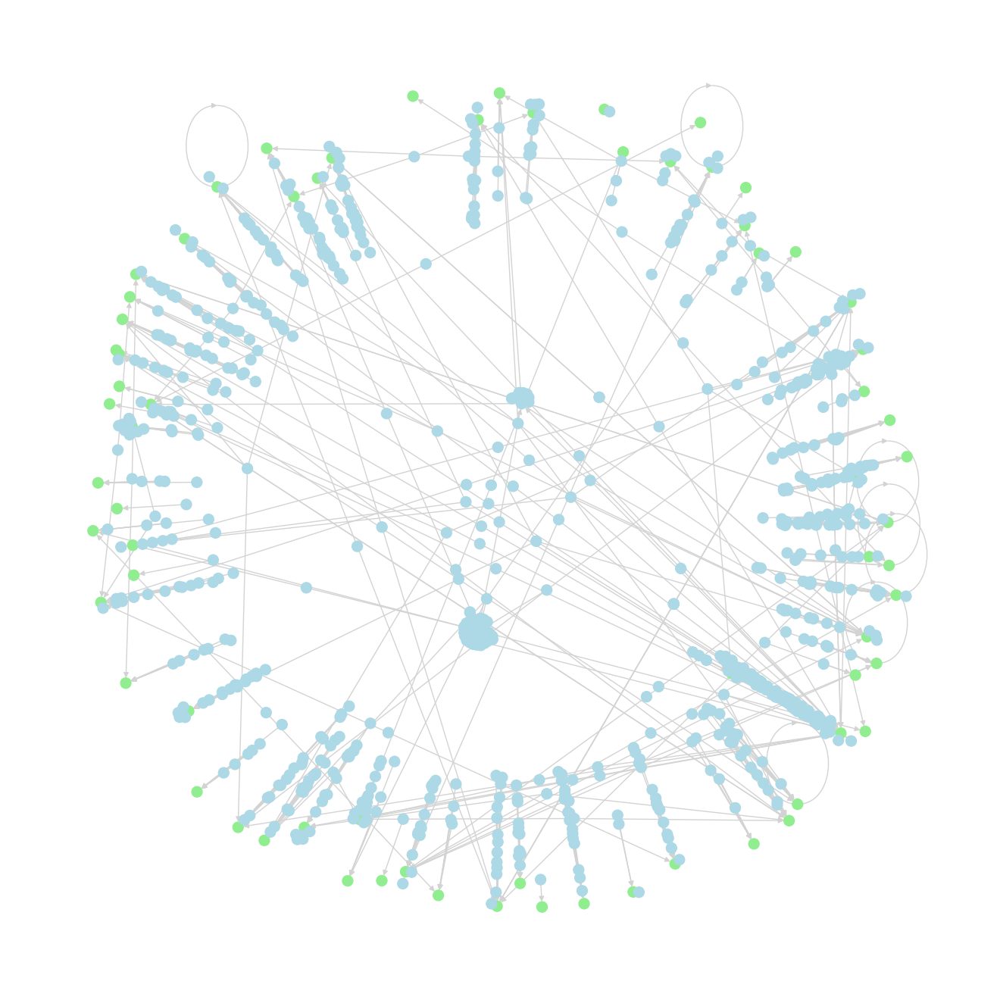

In [ ]:
#Creating a graph with authors being the nodes and the edges indicating to whose post the author are commenting to
#Submission nodes are coloured in green while the comments are being coloured in blue

G = nx.DiGraph()

for idx, row in comments_df.iterrows():
    post_author = row['post_author']
    comment_author = row['comment_author']
    depth = row['depth']

    #dealing with automoderator and unknown nodes
    if comment_author in ["AutoModerator", "Unknown"]:
        continue

    if post_author not in G: #making sure the authors are not being duplicated
        G.add_node(post_author, color='lightgreen' if depth == 0 else 'lightblue', depth=depth)
    if comment_author not in G: #making sure the authors are not being duplicated
        G.add_node(comment_author, color='lightblue', depth=depth)
    G.add_edge(comment_author, post_author)

for node in G.nodes:
    if 'color' not in G.nodes[node]:
        G.nodes[node]['color'] = 'gray'

colors = [G.nodes[n]['color'] for n in G.nodes]

#plot the graph
plt.figure(figsize=(13, 13))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=False, node_color=colors, node_size=100, font_size=8, edge_color='lightgray')
plt.show()

In [ ]:
G["SouthCape"]

AtlasView({'Trimix': {}, 'AlbertoRomGar': {}})

In [ ]:
dict_deg = {}
for n in G.nodes():
  dict_deg[n] = G.degree[n]

In [ ]:
dict_deg

{'itschosenwisely': 11,
 'reality_comes': 1,
 'Samu-ML': 1,
 'not420guilty': 1,
 'Affectionate_Gain305': 1,
 'Cryptizard': 1,
 'orcunayata': 1,
 'DzyPassio': 1,
 'Strange_Library9159': 1,
 'Shiiifo': 1,
 'OutlandishnessOk626': 1,
 'No-Menu-4211': 1,
 'market_chimp': 18,
 'sanman': 1,
 'pi511': 1,
 'Taykeshi': 1,
 'mikejsca': 1,
 'guchdog': 1,
 'Lazarous86': 1,
 'Quentin__Tarantulino': 1,
 'PP_Devy': 1,
 'Alex_1776_': 1,
 'chalking_platypus': 1,
 'kiddenz': 1,
 'nzcnzcnz': 1,
 'Funny_Willingness433': 1,
 'Feelsgoodtimmy': 1,
 'fjaoaoaoao': 1,
 'mikhailsharon99': 1,
 'sharkbomb': 1,
 'wirelessBaguette': 1,
 'NasimUddin01': 19,
 'Ambitious_Use_291': 2,
 'PewdsIndianFans': 1,
 'raresaturn': 1,
 'chewie8291': 1,
 'Schackalode': 1,
 'Danielfromtucson': 1,
 'kajri': 1,
 'aknop': 1,
 'tanchaeun': 1,
 'GoldenGrouper': 1,
 'sunplaysbass': 1,
 'idapitbwidiuatabip': 1,
 'Siyutex': 1,
 'Mjlkman': 1,
 'booostd': 1,
 'ortseamle': 1,
 'TheCrazyAcademic': 1,
 'abass_j1': 19,
 'tooold4urcrap': 2,
 'PM_O

In [ ]:
scc = list(nx.strongly_connected_components(G))
scc

[{'itschosenwisely'},
 {'reality_comes'},
 {'Samu-ML'},
 {'not420guilty'},
 {'Affectionate_Gain305'},
 {'Cryptizard'},
 {'orcunayata'},
 {'DzyPassio'},
 {'Strange_Library9159'},
 {'Shiiifo'},
 {'OutlandishnessOk626'},
 {'No-Menu-4211'},
 {'market_chimp'},
 {'sanman'},
 {'pi511'},
 {'Taykeshi'},
 {'mikejsca'},
 {'guchdog'},
 {'Lazarous86'},
 {'Quentin__Tarantulino'},
 {'PP_Devy'},
 {'Alex_1776_'},
 {'chalking_platypus'},
 {'kiddenz'},
 {'nzcnzcnz'},
 {'Funny_Willingness433'},
 {'Feelsgoodtimmy'},
 {'fjaoaoaoao'},
 {'mikhailsharon99'},
 {'sharkbomb'},
 {'wirelessBaguette'},
 {'NasimUddin01'},
 {'TheRustyDonut'},
 {'Ambitious_Use_291'},
 {'PewdsIndianFans'},
 {'raresaturn'},
 {'chewie8291'},
 {'Schackalode'},
 {'Danielfromtucson'},
 {'kajri'},
 {'aknop'},
 {'tanchaeun'},
 {'GoldenGrouper'},
 {'sunplaysbass'},
 {'idapitbwidiuatabip'},
 {'Siyutex'},
 {'Mjlkman'},
 {'booostd'},
 {'ortseamle'},
 {'TheCrazyAcademic'},
 {'abass_j1'},
 {'Trimix'},
 {'princesspbubs'},
 {'tooold4urcrap'},
 {'PM_OC

In [ ]:
wcc = list(nx.weakly_connected_components(G))
wcc

[{'Affectionate_Gain305',
  'Cryptizard',
  'DzyPassio',
  'No-Menu-4211',
  'OutlandishnessOk626',
  'Samu-ML',
  'Shiiifo',
  'Strange_Library9159',
  'itschosenwisely',
  'not420guilty',
  'orcunayata',
  'reality_comes'},
 {'Alex_1776_',
  'Feelsgoodtimmy',
  'Funny_Willingness433',
  'Lazarous86',
  'PP_Devy',
  'Quentin__Tarantulino',
  'Taykeshi',
  'chalking_platypus',
  'fjaoaoaoao',
  'guchdog',
  'kiddenz',
  'market_chimp',
  'mikejsca',
  'mikhailsharon99',
  'nzcnzcnz',
  'pi511',
  'sanman',
  'sharkbomb',
  'wirelessBaguette'},
 {'01000001010010010',
  '100k_2020',
  '1EvilSexyGenius',
  '1protobeing1',
  '467366',
  '6EQUJ5w',
  'AIArtApparel1123',
  'AIExpoEurope',
  'APUsilicon',
  'AbroadRevolutionary6',
  'Abscondias',
  'Absolute-Nobody0079',
  'Acceptable_Box7598',
  'Accurate-Ease1675',
  'Accurate_Economy_812',
  'Acid_Viking',
  'Acrobatic-Gene-724',
  'Active_Impression406',
  'AdamJefferson',
  'Additional-Clerk6123',
  'Adeldor',
  'Aedys1',
  'Aggravating-

In [ ]:
#extracting and sorting betweeness centrality of the graph
bt_cen = nx.betweenness_centrality(G)
bt_cen2= pd.DataFrame(bt_cen.items())
bt_cen2.sort_values(by=1, ascending=False).head()

,0,1
773,ConclusionDifficult,0.000116
780,Certain_End_5192,0.000045
342,Georgeo57,0.000038
547,No-Activity-4824,0.000034
288,princesspbubs,0.000024


In [ ]:
#extracting and sorting degree centrality of the graph
dg_cen = nx.degree_centrality(G)
dg_cen2= pd.DataFrame(dg_cen.items())
dg_cen2.sort_values(by=1, ascending=False).head()

,0,1
384,saffronfan,0.112360
773,ConclusionDifficult,0.040449
557,Senior_tasteey,0.028090
346,Odd-Can-3632,0.023596
177,podaerprime,0.023596


In [ ]:
#extracting and sorting closeness centrality of the graph
cl_cen = nx.closeness_centrality(G)
cl_cen2= pd.DataFrame(cl_cen.items())
cl_cen2.sort_values(by=1, ascending=False).head()

,0,1
384,saffronfan,0.111456
773,ConclusionDifficult,0.040992
280,Trimix,0.029465
557,Senior_tasteey,0.028090
884,Imagine-your-success,0.027620


In [ ]:
sid = SentimentIntensityAnalyzer()

In [ ]:
#Definition of a function for text preprocessing
def clean_text(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    tokens = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    cleaned_text = ' '.join(tokens)
    return cleaned_text

# Apply the clean_text function to post_text and comment_text
comments_df['clean_post_text'] = comments_df['post_text'].apply(clean_text)
comments_df['clean_comment_text'] = comments_df['comment_text'].apply(clean_text)

In [ ]:
comments_df['post_sentiment'] = comments_df['clean_post_text'].apply(lambda text: sid.polarity_scores(text)['compound'])
comments_df['comment_sentiment'] = comments_df['clean_comment_text'].apply(lambda text: sid.polarity_scores(text)['compound'])

# Define thresholds for sentiment categorization
def categorize_sentiment(score):
    if score > 0.1:
        return 'Pro AI'
    elif score < -0.1:
        return 'Anti AI'
    else:
        return 'Neutral'

comments_df['post_sentiment_category'] = comments_df['post_sentiment'].apply(categorize_sentiment)
comments_df['comment_sentiment_category'] = comments_df['comment_sentiment'].apply(categorize_sentiment)

In [ ]:
comments_df

,post_author,post_text,comment_author,comment_text,depth,clean_post_text,clean_comment_text,post_sentiment,comment_sentiment,post_sentiment_category,comment_sentiment_category
0,itschosenwisely,ChatGPT doesn't work in Iran: Can someone ask ...,reality_comes,Lots of things are blocked in Iran?,0,chatgpt doesnt work iran someone ask chatgptca...,lots things blocked iran,-0.1280,-0.2732,Anti AI,Anti AI
1,itschosenwisely,ChatGPT doesn't work in Iran: Can someone ask ...,Samu-ML,"it said: ""I'm sorry, but I am just a computer ...",0,chatgpt doesnt work iran someone ask chatgptca...,said im sorry computer program ability blocked...,-0.1280,-0.8316,Anti AI,Anti AI
2,itschosenwisely,ChatGPT doesn't work in Iran: Can someone ask ...,not420guilty,Use a vpn? Seriously. You know that.,0,chatgpt doesnt work iran someone ask chatgptca...,use vpn seriously know,-0.1280,-0.1779,Anti AI,Anti AI
3,itschosenwisely,ChatGPT doesn't work in Iran: Can someone ask ...,Affectionate_Gain305,This is not blocked by the Iranian government!...,0,chatgpt doesnt work iran someone ask chatgptca...,blocked iranian government website wont let ir...,-0.1280,0.5994,Anti AI,Pro AI
4,itschosenwisely,ChatGPT doesn't work in Iran: Can someone ask ...,Cryptizard,How can you not be aware of sanctions against ...,0,chatgpt doesnt work iran someone ask chatgptca...,aware sanctions country troll post,-0.1280,0.0000,Anti AI,Neutral
...,...,...,...,...,...,...,...,...,...,...,...
933,Imagine-your-success,How do you use ChatGPT to make a maximum amoun...,ConclusionDifficult,Ask it for investment advice /s,0,use chatgpt make maximum amount money,ask investment advice,0.0000,0.0000,Neutral,Neutral
934,Imagine-your-success,How do you use ChatGPT to make a maximum amoun...,New_Camera_6800,None because everyone else is using it too. It...,0,use chatgpt make maximum amount money,none everyone else using priced,0.0000,0.0000,Neutral,Neutral
935,mehul_gupta1997,ChatGPT for PPT creation (free)Check out this ...,PSMF_Canuck,No.,0,chatgpt ppt creation freecheck demo use chatgp...,,0.7579,0.0000,Pro AI,Neutral
936,krunal_bhimani_,"Chat Smarter, Not Harder: Automate WhatsApp wi...",saad_alsaad,Great feature,0,chat smarter harder automate whatsapp chatgpti...,great feature,0.8271,0.6249,Pro AI,Pro AI


In [ ]:
#Performing community detection with girvan newman
c = list(nx.community.girvan_newman(G))
c

[({'Affectionate_Gain305',
   'Cryptizard',
   'DzyPassio',
   'No-Menu-4211',
   'OutlandishnessOk626',
   'Samu-ML',
   'Shiiifo',
   'Strange_Library9159',
   'itschosenwisely',
   'not420guilty',
   'orcunayata',
   'reality_comes'},
  {'Alex_1776_',
   'Feelsgoodtimmy',
   'Funny_Willingness433',
   'Lazarous86',
   'PP_Devy',
   'Quentin__Tarantulino',
   'Taykeshi',
   'chalking_platypus',
   'fjaoaoaoao',
   'guchdog',
   'kiddenz',
   'market_chimp',
   'mikejsca',
   'mikhailsharon99',
   'nzcnzcnz',
   'pi511',
   'sanman',
   'sharkbomb',
   'wirelessBaguette'},
  {'467366',
   'APUsilicon',
   'AbroadRevolutionary6',
   'Acceptable_Box7598',
   'Acrobatic-Gene-724',
   'Aggravating-Plum3637',
   'Agreeable-Archer792',
   'AlternativeFilm8886',
   'Ambitious_Use_291',
   'AppropriateScience71',
   'AramcBrat',
   'ArthurTMurray',
   'AslanOrso',
   'AutoBudAlpha',
   'Ava-AI',
   'B3lthazar',
   'BOS2BWI',
   'BUSINESS-ESSENTIALS',
   'Butefluko',
   'ButterscotchNo7634',
 

In [ ]:
import matplotlib.colors as mcolors

In [ ]:
# Assign a unique color to each community in the graph and create a dictionary of node colors
def create_community_node_colors(graph, communities):
    number_of_colors = len(communities)
    color_palette = list(mcolors.TABLEAU_COLORS.values())
    if number_of_colors > len(color_palette):
        color_palette = color_palette * (number_of_colors // len(color_palette) + 1)

    node_colors = {}
    for i, community in enumerate(communities):
        for node in community:
            node_colors[node] = color_palette[i]

    return node_colors

node_colors = create_community_node_colors(G, c[0])


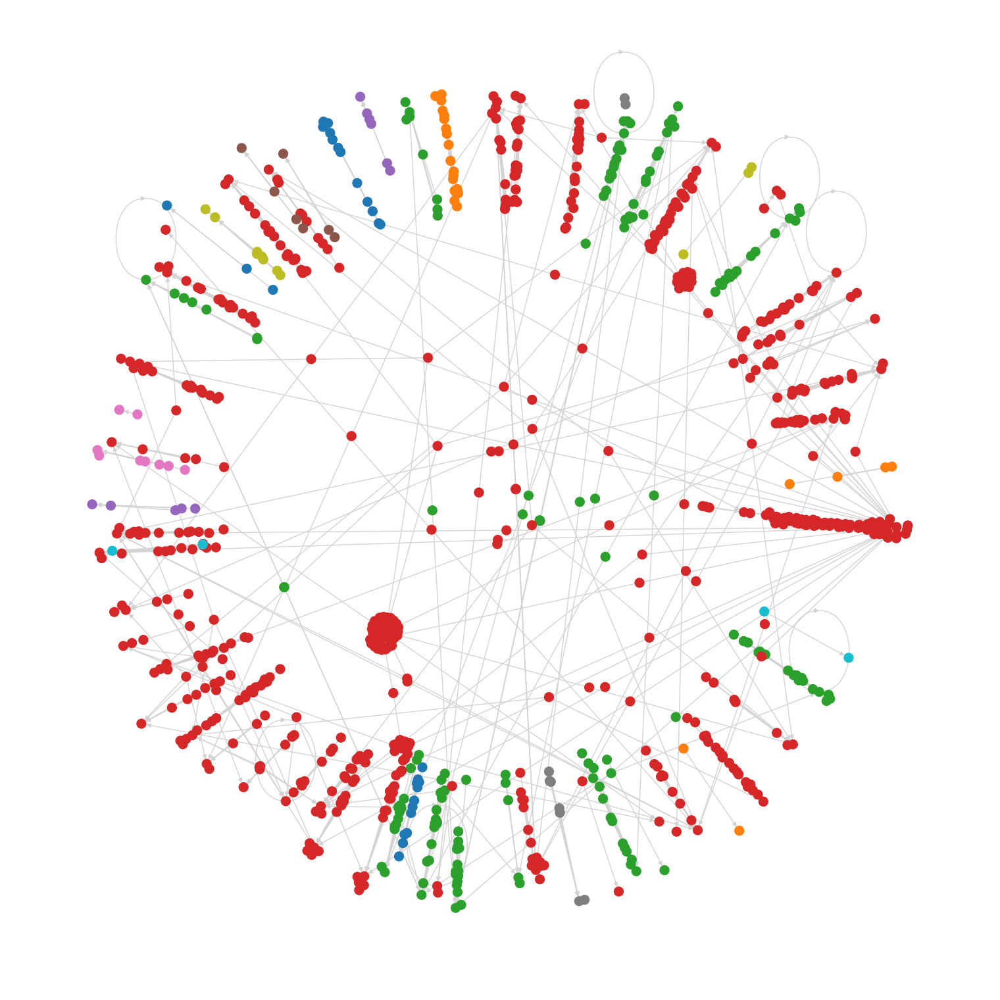

In [ ]:
#Plotting the graph with different node colours, based on the community.
for node, color in node_colors.items():
    G.nodes[node]['color'] = color

colors = [G.nodes[n]['color'] for n in G.nodes]

plt.figure(figsize=(15, 15))
nx.draw(G, pos, with_labels=False, node_color=colors, node_size=100, font_size=8, edge_color='lightgray')
plt.show()

In [ ]:
sentiment_color_map = {
    'Pro AI': 'lightgreen',
    'Anti AI': 'lightcoral',
    'Neutral': 'gray'
}

for idx, row in comments_df.iterrows():
    post_author = row['post_author']
    comment_author = row['comment_author']
    post_sentiment_category = row['post_sentiment_category']
    comment_sentiment_category = row['comment_sentiment_category']

    if post_author in G:
        G.nodes[post_author]['color'] = sentiment_color_map.get(post_sentiment_category, 'gray')
    if comment_author in G:
        G.nodes[comment_author]['color'] = sentiment_color_map.get(comment_sentiment_category, 'gray')

for node in G.nodes:
    if 'color' not in G.nodes[node]:
        G.nodes[node]['color'] = 'gray'

colors = [G.nodes[n]['color'] for n in G.nodes]

plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=False, node_color=colors, node_size=100, font_size=8, edge_color='lightgray')
plt.show()



In [ ]:
community_mapping = {}
for i, community in enumerate(c[0]):
    for member in community:
        community_mapping[member] = i

comments_df['community'] = comments_df['post_author'].apply(lambda author: community_mapping[author] if author in community_mapping else -1)

# Aggregate sentiment categories by community
community_sentiment_counts = comments_df.groupby('community').agg({
    'post_sentiment_category': lambda x: x.value_counts().to_dict(),
    'comment_sentiment_category': lambda x: x.value_counts().to_dict()
}).reset_index()

community_sentiment_counts

,community,post_sentiment_category,comment_sentiment_category
0,0,{'Anti AI': 11},"{'Anti AI': 4, 'Pro AI': 4, 'Neutral': 3}"
1,1,{'Pro AI': 18},"{'Pro AI': 14, 'Neutral': 4}"
2,2,"{'Neutral': 58, 'Pro AI': 57, 'Anti AI': 54}","{'Pro AI': 82, 'Neutral': 59, 'Anti AI': 28}"
3,3,"{'Pro AI': 521, 'Anti AI': 120, 'Neutral': 39}","{'Pro AI': 377, 'Neutral': 164, 'Anti AI': 139}"
4,4,{'Pro AI': 5},"{'Pro AI': 3, 'Neutral': 2}"
5,5,{'Pro AI': 3},{'Pro AI': 3}
6,6,{'Pro AI': 6},"{'Pro AI': 3, 'Neutral': 3}"
7,7,{'Pro AI': 1},{'Pro AI': 1}
8,8,{'Pro AI': 4},"{'Neutral': 2, 'Pro AI': 2}"
9,9,{'Pro AI': 1},{'Pro AI': 1}
